## Data Loading

In [ ]:
import os
import pandas as pd
from tqdm import tqdm

# Set the path to the parent folder
base_path = '/content/drive/MyDrive/my_recycling_waste'

# Prepare storage for data
data = []

# Use tqdm for a progress bar
for label in tqdm(os.listdir(base_path), desc="Processing folders"):
    folder_path = os.path.join(base_path, label)
    if os.path.isdir(folder_path):
        for filename in os.listdir(folder_path):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                image_path = os.path.join(folder_path, filename)
                data.append({'image_path': image_path, 'label': label})

# Convert to DataFrame and save
df = pd.DataFrame(data)
df.to_csv('dataset.csv', index=False)

print(f"\n✅ Done! {len(df)} image entries saved to dataset.csv")


Processing folders: 100%|██████████| 9/9 [00:00<00:00, 44.86it/s]


✅ Done! 8371 image entries saved to dataset.csv


Instal Deep Learning Re

In [ ]:
!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [ ]:
df.head()

,image_path,label
0,/content/drive/MyDrive/my_recycling_waste/pape...,paper
1,/content/drive/MyDrive/my_recycling_waste/pape...,paper
2,/content/drive/MyDrive/my_recycling_waste/pape...,paper
3,/content/drive/MyDrive/my_recycling_waste/pape...,paper
4,/content/drive/MyDrive/my_recycling_waste/pape...,paper


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/dataset.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                               image_path  label
count                                                8371   8371
unique                                               8371      9
top     /content/drive/MyDrive/my_recycling_waste/pape...  paper
freq                                                    1   1468
                                          image_path  label
0  /content/drive/MyDrive/my_recycling_waste/pape...  paper
1  /content/drive/MyDrive/my_recycling_waste/pape...  paper
2  /content/drive/MyDrive/my_recycling_waste/pape...  paper
3  /content/drive/MyDrive/my_recycling_waste/pape...  paper
4  /content/drive/MyDrive/my_recycling_waste/pape...  paper


In [ ]:
labels_csv.head()

,image_path,label
0,/content/drive/MyDrive/my_recycling_waste/pape...,paper
1,/content/drive/MyDrive/my_recycling_waste/pape...,paper
2,/content/drive/MyDrive/my_recycling_waste/pape...,paper
3,/content/drive/MyDrive/my_recycling_waste/pape...,paper
4,/content/drive/MyDrive/my_recycling_waste/pape...,paper


In [ ]:
unique_formats = labels_csv['image_path'].apply(lambda x: x.split('.')[-1].lower()).unique()
print("Unique image formats:", unique_formats)


Unique image formats: ['jpg' 'png' 'jpeg' 'gif']


In [ ]:
len(labels_csv)

8370

In [ ]:
from PIL import Image
import pandas as pd

# Allowed formats for your model
allowed_formats = {'jpeg', 'png', 'gif', 'bmp'}

# Tracking counts
valid_count = 0
invalid_images = []

total = len(labels_csv)
print(f"🔍 Validating {total} images...\n")

# Loop through all image paths
for i, path in enumerate(labels_csv['image_path']):
    try:
        with Image.open(path) as img:
            img.verify()  # Checks if image can be opened
            img_format = img.format.lower()
            if img_format not in allowed_formats:
                raise ValueError(f"Unsupported format: {img_format}")
        valid_count += 1
    except Exception as e:
        invalid_images.append((path, str(e)))

    # Progress update
    if (i + 1) % 50 == 0 or (i + 1) == total:
        print(f"✅ Checked {i + 1}/{total} - Valid: {valid_count} | Invalid: {len(invalid_images)}")

# Final results
print("\n🎯 Validation complete.")
print(f"✅ Valid images: {valid_count}")
print(f"❌ Invalid or unsupported images: {len(invalid_images)}")

if invalid_images:
    print("\nExamples of invalid files:")
    for path, error in invalid_images[:5]:  # Show a few
        print(f"🚫 {path} ➜ {error}")


🔍 Validating 8369 images...

✅ Checked 50/8369 - Valid: 50 | Invalid: 0
✅ Checked 100/8369 - Valid: 100 | Invalid: 0
✅ Checked 150/8369 - Valid: 150 | Invalid: 0
✅ Checked 200/8369 - Valid: 200 | Invalid: 0
✅ Checked 250/8369 - Valid: 250 | Invalid: 0
✅ Checked 300/8369 - Valid: 300 | Invalid: 0
✅ Checked 350/8369 - Valid: 350 | Invalid: 0
✅ Checked 400/8369 - Valid: 400 | Invalid: 0
✅ Checked 450/8369 - Valid: 450 | Invalid: 0
✅ Checked 500/8369 - Valid: 500 | Invalid: 0
✅ Checked 550/8369 - Valid: 550 | Invalid: 0
✅ Checked 600/8369 - Valid: 600 | Invalid: 0
✅ Checked 650/8369 - Valid: 650 | Invalid: 0
✅ Checked 700/8369 - Valid: 700 | Invalid: 0
✅ Checked 750/8369 - Valid: 750 | Invalid: 0
✅ Checked 800/8369 - Valid: 800 | Invalid: 0
✅ Checked 850/8369 - Valid: 850 | Invalid: 0
✅ Checked 900/8369 - Valid: 900 | Invalid: 0
✅ Checked 950/8369 - Valid: 950 | Invalid: 0
✅ Checked 1000/8369 - Valid: 1000 | Invalid: 0
✅ Checked 1050/8369 - Valid: 1050 | Invalid: 0
✅ Checked 1100/8369 - Va

In [ ]:
# Remove the invalid image entry from the dataframe
labels_csv = labels_csv[labels_csv['image_path'] != "/content/drive/MyDrive/my_recycling_waste/light blubs/heritage-blog36.jpg"]


<Axes: xlabel='label'>

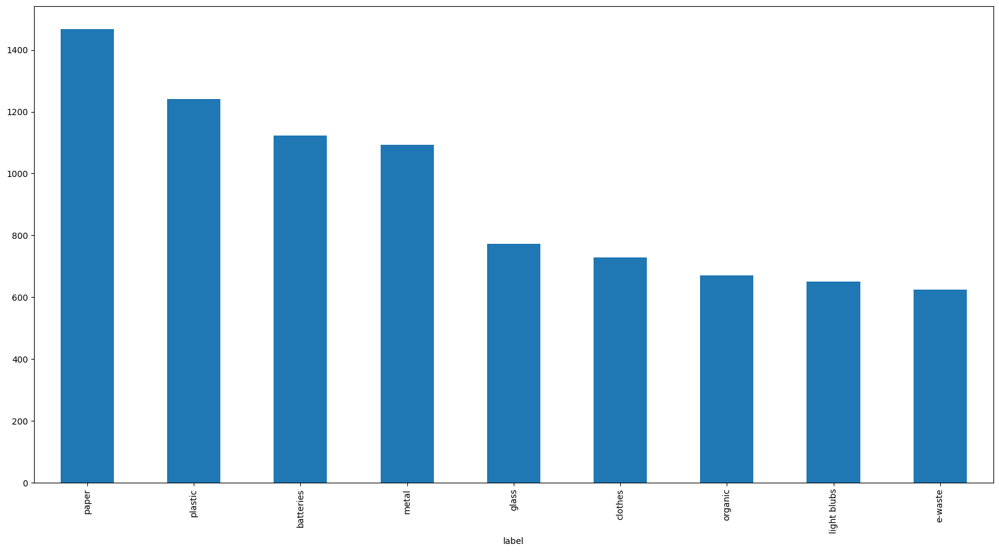

In [ ]:
# How many images are there of each label?
labels_csv["label"].value_counts().plot.bar(figsize=(20, 10))

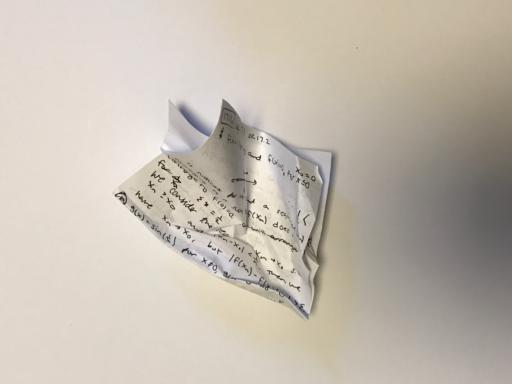

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/my_recycling_waste/paper/paper523.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,image_path,label
0,/content/drive/MyDrive/my_recycling_waste/pape...,paper
1,/content/drive/MyDrive/my_recycling_waste/pape...,paper
2,/content/drive/MyDrive/my_recycling_waste/pape...,paper
3,/content/drive/MyDrive/my_recycling_waste/pape...,paper
4,/content/drive/MyDrive/my_recycling_waste/pape...,paper


In [ ]:
filenames = labels_csv["image_path"].tolist()


In [ ]:
filenames[:10]

['/content/drive/MyDrive/my_recycling_waste/paper/paper521.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper520.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper523.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper522.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper524.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper525.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper526.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper528.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper527.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper53.jpg']

In [ ]:
import os

# Path to the parent folder containing subfolders of images
parent_folder = "/content/drive/MyDrive/my_recycling_waste"

# Recursively count all image files in all subfolders
all_image_paths = []
for dirpath, _, files in os.walk(parent_folder):
    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            all_image_paths.append(os.path.join(dirpath, file))

# Compare with the number of filenames in your dataset
if len(all_image_paths) == len(filenames):
    print("✅ Filenames match actual number of image files. Proceed!")
else:
    print(f"❌ Mismatch: {len(filenames)} filenames vs {len(all_image_paths)} actual image files. Check directory or labels.")


❌ Mismatch: 8370 filenames vs 8369 actual image files. Check directory or labels.


In [ ]:
# Get just the base names (without path or extension) from actual image files
actual_image_ids = [os.path.splitext(os.path.basename(path))[0] for path in all_image_paths]

# Convert filenames to IDs (remove folder and .jpg extension)
expected_ids = [os.path.splitext(os.path.basename(path))[0] for path in filenames]

# Find missing IDs
missing_from_drive = set(expected_ids) - set(actual_image_ids)
extra_in_drive = set(actual_image_ids) - set(expected_ids)

print("Missing from Google Drive:", missing_from_drive)
print("Extra in Google Drive (not in CSV):", extra_in_drive)


Missing from Google Drive: {'khalibottle_recyclable_waste_GIF_660x330', 'cfl-waste-recycling'}
Extra in Google Drive (not in CSV): {'heritage-blog36'}


In [ ]:
import os

# Path to the parent folder containing subfolders of images
parent_folder = "/content/drive/MyDrive/my_recycling_waste"

# Recursively count all image files in all subfolders
all_image_paths = []
for dirpath, _, files in os.walk(parent_folder):
    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            all_image_paths.append(os.path.join(dirpath, file))

# Compare with the number of filenames in your dataset
if len(all_image_paths) == len(filenames):
    print("✅ Filenames match actual number of image files. Proceed!")
else:
    print(f"❌ Mismatch: {len(filenames)} filenames vs {len(all_image_paths)} actual image files. Check directory or labels.")

❌ Mismatch: 8368 filenames vs 8369 actual image files. Check directory or labels.


In [ ]:
# Define the substrings to search for
unwanted_substrings = ['khalibottle_recyclable_waste_GIF_660x330', 'cfl-waste-recycling']

# Filter rows that contain any of the unwanted substrings
matches = labels_csv[labels_csv['image_path'].str.contains('|'.join(unwanted_substrings), case=False, na=False)]

print("Matching rows:")
print(matches)


Matching rows:
                                             image_path        label
4050  /content/drive/MyDrive/my_recycling_waste/glas...        glass
6411  /content/drive/MyDrive/my_recycling_waste/ligh...  light blubs


In [ ]:
# Substrings you want to remove
unwanted_substrings = ['khalibottle_recyclable_waste_GIF_660x330', 'cfl-waste-recycling']

# Drop rows containing any of the unwanted substrings in 'image_path'
labels_csv = labels_csv[
    ~labels_csv['image_path'].str.contains('|'.join(unwanted_substrings), case=False, na=False)
].reset_index(drop=True)

# Confirm removal
print("Updated number of rows:", len(labels_csv))


Updated number of rows: 8368


In [ ]:
filenames = labels_csv["image_path"].tolist()

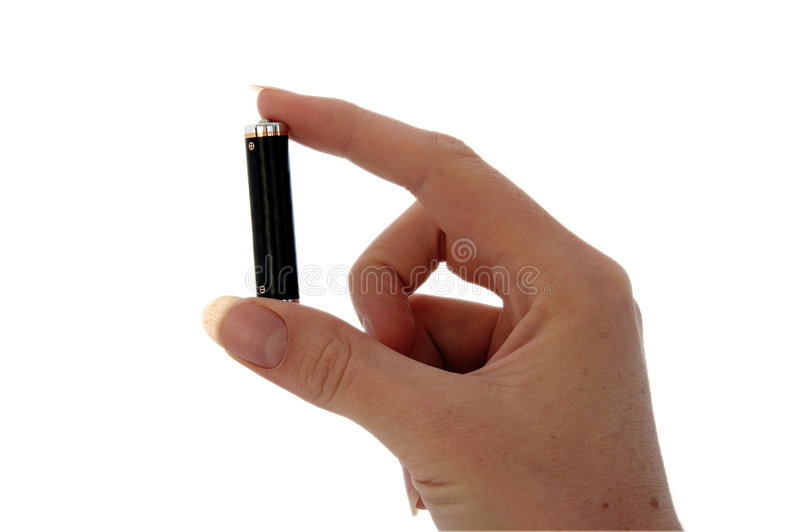

In [ ]:
# One more check
Image(filenames[3000])

In [ ]:
labels_csv["label"][3000]

'batteries'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["label"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['paper', 'paper', 'paper', ..., 'metal', 'metal', 'metal'],
      dtype=object)

In [ ]:
len(labels)

8368

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_labels = np.unique(labels)
len(unique_labels)

9

In [ ]:
unique_labels


array(['batteries', 'clothes', 'e-waste', 'glass', 'light blubs', 'metal',
       'organic', 'paper', 'plastic'], dtype=object)

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_labels

paper


array([False, False, False, False, False, False, False,  True, False])

In [ ]:
len(labels)

8368

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_labels for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False,  True, False]),
 array([False, False, False, False, False, False, False,  True, False])]

In [ ]:
len(boolean_labels)

8368

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_labels == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

paper
(array([7]),)
7
[0 0 0 0 0 0 0 1 0]


In [ ]:
print(labels[5000])
print(boolean_labels[5000].astype(int))

plastic
[0 0 0 0 0 0 0 0 1]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False,  True, False]),
 array([False, False, False, False, False, False, False,  True, False])]

In [ ]:
filenames[:10]

['/content/drive/MyDrive/my_recycling_waste/paper/paper521.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper520.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper523.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper522.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper524.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper525.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper526.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper528.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper527.jpg',
 '/content/drive/MyDrive/my_recycling_waste/paper/paper53.jpg']

### Creating our own validation set


In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

8368

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 3000 #@param {type:"slider", min:1000, max:8370, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X[:NUM_IMAGES],
    y[:NUM_IMAGES],
    test_size=0.2,
    random_state=42,
    stratify=y[:NUM_IMAGES]  # This ensures balanced classes in both sets
)


In [ ]:
len(X_train), len(y_train), len(X_val), len(y_val)

(2400, 2400, 600, 600)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/my_recycling_waste/batteries/ecology-recycling-concept-many-different-types-used-new-battery-rechargeable-accumulator-alkaline-batteries-color-background-134525494.jpg',
  '/content/drive/MyDrive/my_recycling_waste/clothes/assorted-clothes-isolated-heap-colorful-white-36145930.jpg',
  '/content/drive/MyDrive/my_recycling_waste/paper/paper249.jpg',
  '/content/drive/MyDrive/my_recycling_waste/batteries/batteries-carpentry-clamp-energy-compressed-workshop-dark-background-accumulator-alkaline-backgrounds-battery-black-bolt-c-156427847.jpg',
  '/content/drive/MyDrive/my_recycling_waste/paper/paper-413882__340.jpg'],
 [array([ True, False, False, False, False, False, False, False, False]),
  array([False,  True, False, False, False, False, False, False, False])])

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(384, 512, 3)

In [ ]:
image.max(), image.min()

(255, 22)

In [ ]:
image[:2]

array([[[211, 211, 209],
        [211, 211, 209],
        [211, 211, 209],
        ...,
        [163, 161, 162],
        [161, 159, 160],
        [161, 159, 160]],

       [[211, 211, 209],
        [211, 211, 209],
        [211, 211, 209],
        ...,
        [164, 162, 163],
        [162, 160, 161],
        [162, 160, 161]]], dtype=uint8)

In [ ]:
#!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

TF version: 2.15.0
TF Hub version: 0.16.1


In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 512, 3), dtype=uint8, numpy=
array([[[211, 211, 209],
        [211, 211, 209],
        [211, 211, 209],
        ...,
        [163, 161, 162],
        [161, 159, 160],
        [161, 159, 160]],

       [[211, 211, 209],
        [211, 211, 209],
        [211, 211, 209],
        ...,
        [164, 162, 163],
        [162, 160, 161],
        [162, 160, 161]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.8249301 , 0.8288516 , 0.8092438 ],
         [0.8260505 , 0.829972  , 0.81036425],
         [0.8260505 , 0.829972  , 0.81036425],
         ...,
         [0.64845943, 0.6406163 , 0.6445378 ],
         [0.642677  , 0.6348339 , 0.63875544],
         [0.63137245, 0.6235293 , 0.6274508 ]],
 
        [[0.82717097, 0.83109254, 0.8114847 ],
         [0.8232494 , 0.82717097, 0.8075631 ],
         [0.81540626, 0.81932783, 0.79972   ],
         ...,
         [0.6551221 , 0.64727896, 0.65120053],
         [0.65098035, 0.6431372 , 0.6470588 ],
         [0.64201665, 0.6341735 , 0.6380951 ]],
 
        [[0.817367  , 0.8212886 , 0.80168074],
         [0.8136655 , 0.8175871 , 0.79797924],
         [0.8086836 , 0.81260514, 0.7929973 ],
         ...,
         [0.6579833 , 0.65014017, 0.65406173],
         [0.65770304, 0.6498599 , 0.6537815 ],
         [0.64873934, 0.6408962 , 0.64481777]],
 
        ...,
 
        [[0.7464986 , 0.742577  

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 9), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 9), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_labels[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.bool, name=None))>

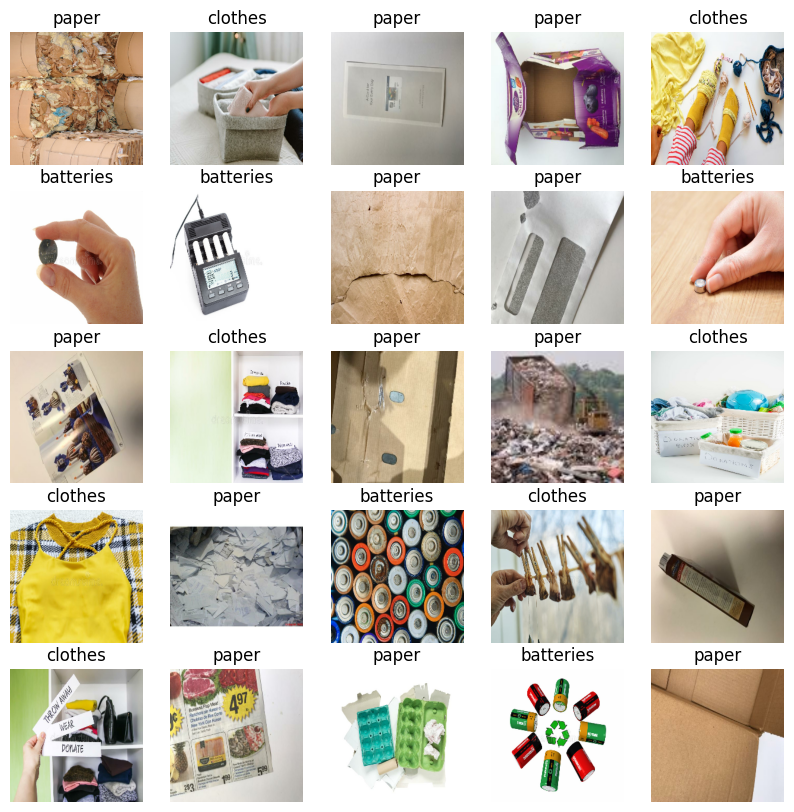

In [ ]:
# # Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

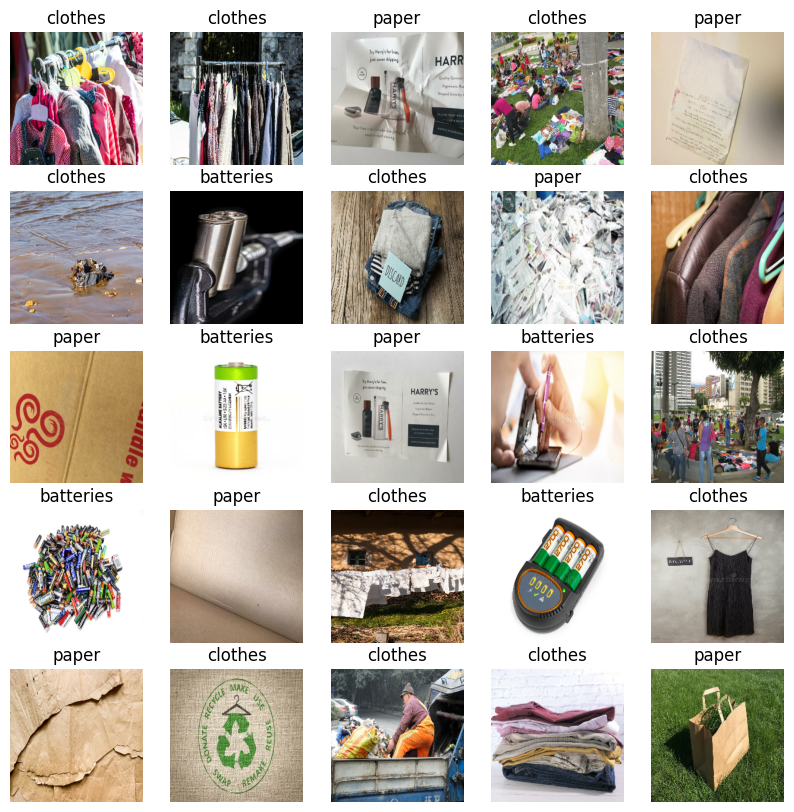

In [ ]:
#  Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE

224

In [1]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_labels)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

NameError: name 'IMG_SIZE' is not defined

In [ ]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 9)                 9018      
                                                                 
Total params: 5441731 (20.76 MB)
Trainable params: 9018 (35.23 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [ ]:
NUM_EPOCHS = 10 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/10
75/75 [==============================] - 171s 2s/step - loss: 0.5310 - accuracy: 0.8196 - val_loss: 0.2325 - val_accuracy: 0.9050
Epoch 2/10
75/75 [==============================] - 170s 2s/step - loss: 0.1552 - accuracy: 0.9429 - val_loss: 0.1669 - val_accuracy: 0.9400
Epoch 3/10
75/75 [==============================] - 169s 2s/step - loss: 0.1090 - accuracy: 0.9642 - val_loss: 0.1535 - val_accuracy: 0.9400
Epoch 4/10
75/75 [==============================] - 159s 2s/step - loss: 0.0824 - accuracy: 0.9750 - val_loss: 0.1404 - val_accuracy: 0.9400
Epoch 5/10
75/75 [==============================] - 166s 2s/step - loss: 0.0667 - accuracy: 0.9825 - val_loss: 0.1396 - val_accuracy: 0.9450
Epoch 6/10
75/75 [==============================] - 166s 2s/step - loss: 0.0554 - accuracy: 0.9837 - val_loss: 0.1393 - val_accuracy: 0.9467
Epoch 7/10
75/75 [==============================] - 165s 2s/s

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 9), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

19/19 [==============================] - 46s 2s/step


array([[4.7218713e-09, 9.9999791e-01, 3.9772891e-10, ..., 5.3647899e-11,
        2.0234618e-06, 1.4011110e-10],
       [7.1937720e-08, 9.9993593e-01, 1.2358513e-08, ..., 3.1285501e-09,
        6.3862193e-05, 6.2087507e-10],
       [6.5176707e-04, 1.2824665e-02, 3.5235196e-08, ..., 5.4519165e-07,
        9.8652297e-01, 5.6763099e-08],
       ...,
       [9.5428788e-08, 9.9987125e-01, 7.0747106e-08, ..., 3.5981975e-07,
        1.2812694e-04, 3.9977721e-08],
       [1.5250479e-10, 9.9999946e-01, 1.4010465e-10, ..., 2.9267595e-11,
        4.2587521e-07, 3.6230506e-12],
       [9.9838251e-01, 9.2072012e-05, 6.3093030e-06, ..., 2.5241748e-06,
        1.5028395e-03, 1.7521670e-06]], dtype=float32)

In [ ]:
predictions[0]

array([4.7218713e-09, 9.9999791e-01, 3.9772891e-10, 1.7186853e-10,
       4.9804810e-10, 1.1650586e-10, 5.3647899e-11, 2.0234618e-06,
       1.4011110e-10], dtype=float32)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_labels[np.argmax(predictions[index])]}")

[1.1738457e-05 9.9720579e-01 6.6990893e-08 1.0565507e-08 4.0488445e-08
 2.5708140e-09 3.4444778e-08 2.7823178e-03 7.4368078e-10]
Max value (probability of prediction): 0.9972057938575745
Sum: 1.0
Max index: 1
Predicted label: clothes


In [ ]:
unique_labels[1]

'clothes'

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_labels[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'clothes'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.06175971, 0.02318178, 0.00504202],
         [0.12207009, 0.02314301, 0.00905987],
         [0.15070029, 0.02913166, 0.01736695],
         ...,
         [0.66835564, 0.70059186, 0.72070384],
         [0.5955956 , 0.6563717 , 0.68896097],
         [0.5962334 , 0.63152754, 0.66682166]],
 
        [[0.05544093, 0.02613671, 0.00372774],
         [0.11453582, 0.02325805, 0.00757178],
         [0.15070029, 0.02913166, 0.01736695],
         ...,
         [0.87365174, 0.7325029 , 0.786552  ],
         [0.6380649 , 0.68907595, 0.7144621 ],
         [0.6132516 , 0.6478903 , 0.68579173]],
 
        [[0.04132028, 0.02507378, 0.        ],
         [0.10313877, 0.02322054, 0.00392157],
         [0.15070029, 0.02913166, 0.01736695],
         ...,
         [0.96612656, 0.6748506 , 0.7061658 ],
         [0.71341044, 0.67836785, 0.7251814 ],
         [0.6021985 , 0.64711624, 0.6772894 ]],
 
        ...,
 
        [[0.5325206 , 0.24603611, 0.40356284],
         [0.5125427 , 0.02943577, 0.11380

Now we've got ways to get get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

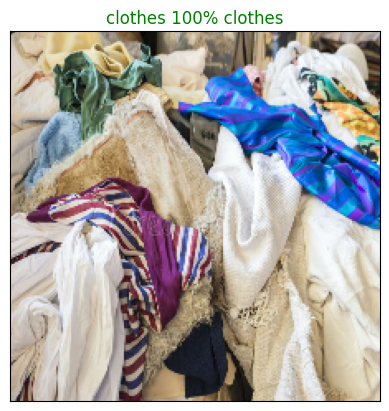

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

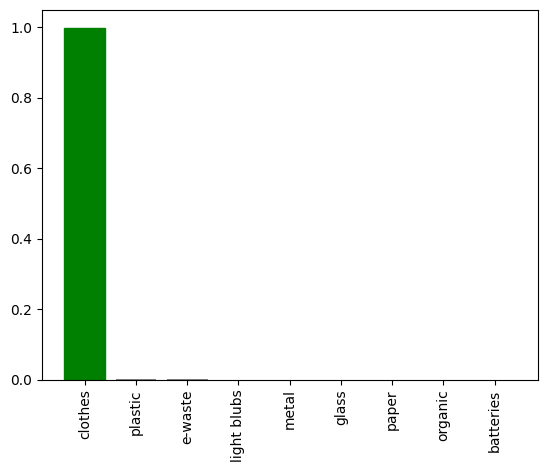

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

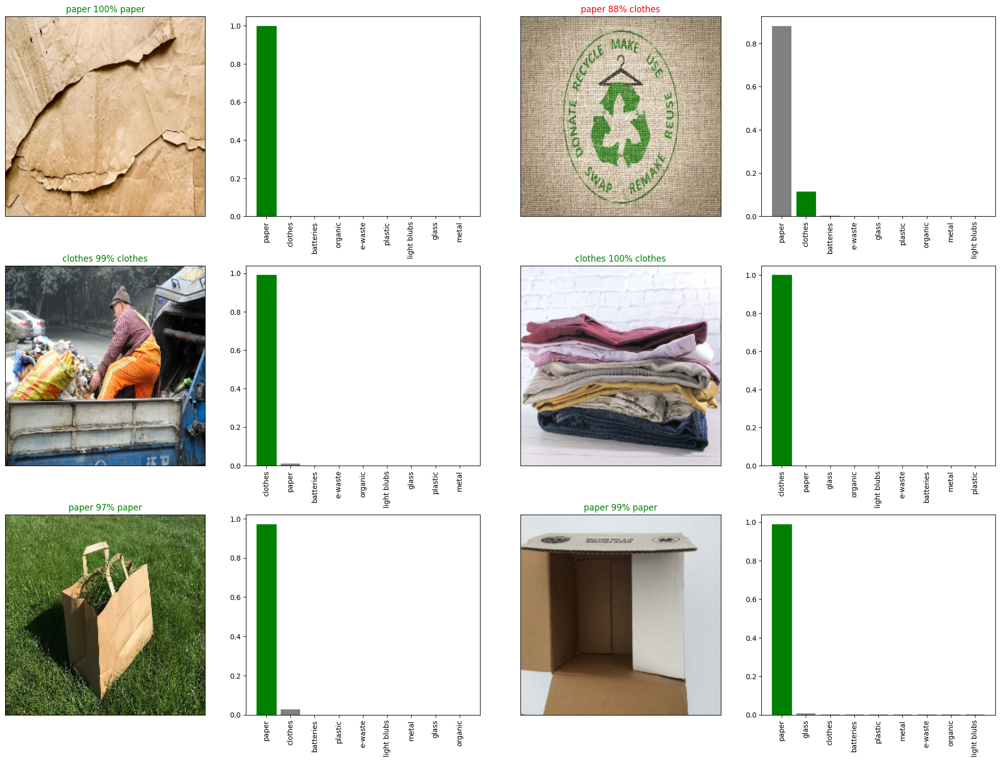

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/waste models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained
save_model(model, suffix="first-images-mobilenetv2-waste")

Saving model to: /content/drive/MyDrive/waste models/20250521-20521747860729-first-images-mobilenetv2-waste.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/waste models/20250521-20521747860729-first-images-mobilenetv2-waste.h5'

In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 MB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.1/323.1 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.2/95.2 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 70.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 3.8 MB/s eta 0:00:00


In [ ]:
import gradio as gr
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np

# Load your trained model
model = tf.keras.models.load_model(
    "/content/drive/MyDrive/waste models/20250521-20511747860705-first-images-mobilenetv2-waste.h5",  # Update path if needed
    custom_objects={'KerasLayer': hub.KerasLayer}
)

# Define your waste class labels
class_names = ['batteries', 'clothes', 'e-waste', 'glass', 'light blubs',
               'metal', 'organic', 'paper', 'plastic']
IMG_SIZE = 224

# Image preprocessing function
def preprocess_image(image):
    image = tf.convert_to_tensor(image, dtype=tf.float32)
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE)) / 255.0
    return tf.expand_dims(image, axis=0)

# Prediction function
def predict_waste(image):
    processed = preprocess_image(image)
    preds = model.predict(processed)
    label = class_names[np.argmax(preds)]
    confidence = float(np.max(preds))
    return f"{label} ({confidence:.2f})"

# Example images – update these paths with actual examples in your Colab space
examples = [
    ["/content/Zeitungen-und-Zeitschriften.png"],
    ["/content/hazardous-toxic-electronic-waste-mixture-260nw-1593448036.jpg"],
    ["/content/yellow-metal-waste-skip-near-warehouse-35000927.jpg"],
    ["/content/zero-waste-recycling-wooden-thing-wooden-background-zero-waste-recycling-wooden-thing-wooden-background-flat-lay-158056259.jpg"]
]

# Launch Gradio Interface
iface = gr.Interface(
    fn=predict_waste,
    inputs=gr.Image(type="numpy", label="Upload a Waste Image"),
    outputs="text",
    title="Waste Classification Model 🌱",
    description="Upload an image of a waste item to classify it as one of 9 categories.",
    examples=examples
)

iface.launch()


It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://3609badf3cf84becfa.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
